朴素贝叶斯实现
训练，对于类别yi
①计算每个特征的条件概率
②计算总体条件概率（朴素贝叶斯假设特征独立，故将①步骤乘起来即可）
③计算后验概率（总体条件概率*yi的先验概率）
预测：后验概率最大的类别yi为预测结果

In [ ]:
class NaiveBayes:
  def __init__(self,X,y):
    self.X=X
    self.y=y
    self.classes=[]
    self.prior_probability=[]
    self.conditional_probability=[]
    
    self.unique_values=[]
    self.unique_values_count=[]
    self.unique_values_count_per_class=[]
    self.unique_values_count_per_class_per_feature=[]
  # 计算总体条件概率
  def calculate_conditional_probability(self,feature_index,lable_y):
    # 提取特定特征列的所有元素  
    column_values = [row[feature_index] for row in self.X]    
    unique_values = set(column_values) 
    P_Xy=1 
    for feature_x in unique_values:
      # 防止除0错误
      if len(self.X[feature_index])==0:
        # continue
        return 0
      count=len(self.X[feature_index])
      count_ab=sum(1 if (self.X[feature_index][i]==feature_x and self.y[i]==lable_y) else 0 for i in range(count))
      P_ab=count_ab/count
      count_b=sum(1 if self.y[i]==lable_y else 0 for i in range(count))
      P_b=count_b/count
      P_Xy*=P_ab/P_b
    return P_Xy
  def predict(self,y_test):
    # 初始化概率数组
    probabilities = np.zeros((len(y_test), len(self.class_prior)))
    for i, y in enumerate(y_test):
      for label, prior in self.class_prior.items():
        # 初始化后验概率的对数（避免数值下溢）
        log_prob = np.log(prior)
        # 计算连续特征的概率





In [1]:
import numpy as np  
from collections import defaultdict, Counter  
from scipy.stats import multivariate_normal  
  
class NaiveBayes:  
    def fit(self, X_train, y_train):  
        # 初始化类别计数器和类别条件概率  
        self.class_counts = Counter(y_train) #存储所有类别的计数 
        
        self.means = {}  
        self.variances = {}  
        self.feature_counts = defaultdict(lambda: defaultdict(int))  
        self.class_prior = {}  
  
        # 计算先验概率  
        total_samples = len(y_train)  
        for label in self.class_counts:  
            self.class_prior[label] = self.class_counts[label] / total_samples  
  
            # 计算连续特征的均值和方差  
            X_label = X_train[y_train == label]  
            self.means[label] = np.mean(X_label, axis=0)  
            self.variances[label] = np.var(X_label, axis=0)  
  
            # 计算离散特征的概率分布  
            for idx, value in np.ndenumerate(X_label):  
                if isinstance(value, int) or isinstance(value, bool):  # 假设整数和布尔值为离散特征  
                    self.feature_counts[label][idx] += Counter({value: 1})  
  
    def _gaussian_probability(self, x, mean, variance):  
        # 计算高斯分布的概率密度函数  
        coefficient = 1.0 / np.sqrt(2 * np.pi * variance)  
        exponent = np.exp(-0.5 * ((x - mean) ** 2) / variance)  
        return coefficient * exponent  
  
    def _multinomial_probability(self, x, feature_count, total_count):  
        # 计算多项式分布的概率  
        p_x = (feature_count[x] + 1) / (total_count + len(feature_count))  # 拉普拉斯平滑  
        return p_x  
  
    def predict_proba(self, X_test):  
        # 初始化概率数组  
        probabilities = np.zeros((len(X_test), len(self.class_prior)))  
  
        for i, x_test in enumerate(X_test): 
            # print(self.class_prior) 

            for label, prior in self.class_prior.items():  
                # 初始化后验概率的对数（避免数值下溢）  
                log_prob = np.log(prior)  
                # print(self.means[label])
                # 计算连续特征的概率  
                mean = self.means[label]  
                variance = self.variances[label] 
                
                if type(mean)==np.float64:
                    mean=[mean]
                    variance=[variance]

                 
                for j in range(len(mean)):  
                    log_prob += np.log(self._gaussian_probability(x_test[j], mean[j], variance[j]))  
  
                # 计算离散特征的概率  
                for idx, value in np.ndenumerate(x_test):  
                    if isinstance(value, int) or isinstance(value, bool):  # 假设整数和布尔值为离散特征  
                        feature_count = self.feature_counts[label][idx]  
                        total_count = sum(feature_count.values())  
                        log_prob += np.log(self._multinomial_probability(value, feature_count, total_count))  
  
                probabilities[i, list(self.class_prior.keys()).index(label)] = np.exp(log_prob)  
  
        # 归一化概率  
        probabilities /= np.sum(probabilities, axis=1, keepdims=True)  
        return probabilities  
  
    def predict(self, X_test):  
        # 返回概率最高的类别  
        probabilities = self.predict_proba(X_test)  
        return np.argmax(probabilities, axis=1)  

d:\anaconda\envs\TF\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: divide by zero encountered in double_scalars
d:\anaconda\envs\TF\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in double_scalars
d:\anaconda\envs\TF\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in double_scalars


In [2]:
print(predictions)

[0 0]


In [1]:
import numpy as np  
  
class GaussianNaiveBayes:  
    def fit(self, X_train, y_train):  
        # 计算先验概率  
        self.class_prior = {}  
        for label in np.unique(y_train):  
            self.class_prior[label] = np.sum(y_train == label) / len(y_train)  
          
        # 计算每个类别的均值和方差  
        self.mean = {}  
        self.var = {}  
        for label in np.unique(y_train):  
            X_label = X_train[y_train == label]  
            self.mean[label] = np.mean(X_label, axis=0)  
            self.var[label] = np.var(X_label, axis=0)  
      
    def predict_proba(self, X_test):  
        # 初始化概率数组  
        probabilities = np.zeros((X_test.shape[0], len(self.class_prior)))  
          
        # 计算每个类别的后验概率  
        for idx, x_test in enumerate(X_test):  
            for label, prior in self.class_prior.items():  
                mean = self.mean[label]  
                var = self.var[label]  
                numerator = np.exp(-0.5 * np.sum(((x_test - mean)**2) / var))  
                denominator = np.sqrt(np.prod(2 * np.pi * var))  
                probabilities[idx, list(self.class_prior.keys()).index(label)] = prior * numerator / denominator  
          
        # 归一化概率  
        probabilities /= np.sum(probabilities, axis=1, keepdims=True)  
        return probabilities  
      
    def predict(self, X_test):  
        # 返回概率最高的类别  
        probabilities = self.predict_proba(X_test)  
        return np.argmax(probabilities, axis=1)  


In [1]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
import numpy as np
import numpy as np  
  
def evaluate_classifier_multiple_times(classifier, X, y, n_iterations=10):  
    all_accuracies = []  
    all_f1_scores = []  
  
    for iteration in range(n_iterations):  
        # 设置十折交叉验证，每次使用不同的random_state  
        kf = KFold(n_splits=10, shuffle=True, random_state=42 + iteration * 10)  # 使用迭代次数作为随机种子  
        scores = []  
        f1_scores_iter = []  
  
        # 遍历交叉验证的每一折  
        for fold, (train_index, test_index) in enumerate(kf.split(X)):  
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]  
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]  
  
            # 将pandas读取的数据转化为list形式
            X_train = X_train.values.tolist()  
            y_train = y_train.values.tolist()  
            X_test = X_test.values.tolist()  
            y_test = y_test.values.tolist()  
           
            X_train = np.array(X_train)
            y_train = np.array(y_train)

            
            nb = classifier.NaiveBayes()
            nb.fit(X_train,y_train)
       

            y_pred=nb.predict( X_test) 
 
            # print('y_pred',y_pred,len(y_pred))
            # print('y_test',y_test,len(y_test))
            accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)  
            f1 = f1_score(y_test, y_pred, average='macro')  
            scores.append(accuracy)  
            f1_scores_iter.append(f1)  
  
        mean_accuracy = np.mean(scores)  
        std_accuracy = np.std(scores)  
        mean_f1 = np.mean(f1_scores_iter)  
        print(f'第{iteration}次',mean_accuracy)  
        all_accuracies.append(mean_accuracy)  
        all_f1_scores.append(mean_f1)  
  
        # print(f"Iteration {iteration + 1}: Mean Accuracy = {mean_accuracy:.4f}, Std Accuracy = {std_accuracy:.4f}, Mean F1 Score = {mean_f1:.4f}")  
  
    overall_mean_accuracy = np.mean(all_accuracies)  
    overall_std_accuracy = np.std(all_accuracies)  
    overall_mean_f1 = np.mean(all_f1_scores)  
  
    return overall_mean_accuracy, overall_std_accuracy, overall_mean_f1  
  
# # 示例调用  
# # classifier_instance = YourClassifier()  # 替换为你的分类器实例  
# # X = your_X_data  # 替换为你的特征数据  
# # y = your_y_data  # 替换为你的标签数据  
# # k = your_k_value  # 替换为你的k值  
# # evaluate_classifier_multiple_times(classifier_instance, X, y, k)


In [3]:
import pandas as pd
from sklearn.discriminant_analysis import StandardScaler
from package_py import Bayes5

    
file_paths =[ "data\\gla.xls"]  # 实际文件路径
# file_paths =[ "data\\bal.xls", "data\\gla.xls", "data\\hay.xls", "data\\iri.xls", "data\\new.xls", "data\\win.xls", "data\\zoo.xls"]  # 实际文件路径
# mean_accuracys=[]
for i in range(len(file_paths)):
    file_path=file_paths[i]

    data = pd.read_excel(file_path, header=None)  
    # 将数据分为特征和标签  
    X = data.iloc[:, :-1]  # 前4列是特征  
    y = data.iloc[:, -1]   # 最后一列是分类标签  
    
    # 数据标准hua
    scaler = StandardScaler()  
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

    mean_accuracy,std_accuracy,f1=evaluate_classifier_multiple_times(Bayes5,X_scaled_df,y,10)
    # mean_accuracys.append(mean_accuracy)

    # 使用 f-string 格式化输出  
    print(f'{file_path} \n  mean_accuracy: {mean_accuracy:.3f} std_accuracy: {std_accuracy:.3f} f1: {f1:.3f}')



self.conditional_prob {1: {0: {-2.0514564366210704: 0.015384615384615385, -0.8896482232702613: 0.015384615384615385, -0.8764458572095166: 0.015384615384615385, -0.8170352099358724: 0.015384615384615385, -0.7939310693294592: 0.015384615384615385, -0.7213180559949971: 0.015384615384615385, -0.3846577214444686: 0.015384615384615385, -0.3813571299293191: 0.015384615384615385, -0.3351488487164928: 0.015384615384615385, -0.33184825720127004: 0.015384615384615385, -0.31204470811007967: 0.015384615384615385, -0.3087441165948569: 0.015384615384615385, -0.2955417505340389: 0.015384615384615385, -0.29224115901888936: 0.015384615384615385, -0.28563997598844376: 0.015384615384615385, -0.2823393844732942: 0.015384615384615385, -0.2757382014428486: 0.015384615384615385, -0.27243760992769905: 0.03076923076923077, -0.2691370184124763: 0.015384615384615385, -0.26583642689725345: 0.015384615384615385, -0.24933346932128594: 0.015384615384615385, -0.24273228629084032: 0.03076923076923077, -0.23943169477561

混合版

In [4]:
import pandas as pd
import numpy as np

def determine_feature_types(data):
    """
    Determine if a feature is continuous based on the condition that
    the number of unique values exceeds one-third of the total number of samples.
    
    Parameters:
    data (pd.DataFrame): The dataset to analyze.
    
    Returns:
    dict: A dictionary with feature names as keys and boolean values indicating
          whether the feature is continuous.
    """
    n_samples = len(data)
    feature_types = []
    
    for column in data.columns:
        unique_values_count = len(data[column].unique())
        if unique_values_count > n_samples / 3:
            feature_types.append(True)  # Continuous
        else:
            feature_types.append(False)  # Not continuous (categorical)
    
    return feature_types

# Example usage:
if __name__ == "__main__":
    # Create a sample dataset
    data = pd.DataFrame({
        'A': np.random.randint(0, 10, 100),  # Categorical-like (low unique values)
        'B': np.random.rand(100),            # Continuous
        'C': np.random.choice(['red', 'blue', 'green'], 100),  # Categorical
        'D': np.random.randint(0, 1000, 100) # Continuous-like (high unique values)
    })
    
    # Determine feature types
    feature_types = determine_feature_types(data)
    print(feature_types)
    # # Print the results
    # for feature, is_continuous in feature_types.items():
    #     print(f"Feature '{feature}' is continuous: {is_continuous}")
    
    # Now you can use this dictionary to conditionally apply different treatments
    # in your fit function or further processing pipeline.

[False, True, False, True]


In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
import numpy as np
import numpy as np  
def determine_feature_types(data, feature_names=None):
    """
    Determine if a feature (column in a 2D NumPy array) is continuous based on the condition that
    the number of unique values exceeds one-third of the total number of samples.
    
    Parameters:
    data (np.ndarray): The dataset to analyze, expected to be a 2D NumPy array.
    feature_names (list of str, optional): List of feature names corresponding to the columns in data.
                                          If not provided, integer indices will be used.
    
    Returns:
    dict: A dictionary with feature names or indices as keys and boolean values indicating
          whether the feature is continuous.
    """
    if not isinstance(data, np.ndarray) or len(data.shape) != 2:
        raise ValueError("Input data must be a 2D NumPy array.")
    
    n_samples, n_features = data.shape
    feature_types = []
    
    if feature_names is None:
        feature_names = [f"feature_{i}" for i in range(n_features)]
    
    for i, feature_name in enumerate(feature_names):
        unique_values_count = len(np.unique(data[:, i]))
        if unique_values_count > n_samples / 4:
            feature_types.append(False)  # Continuous
        else:
            feature_types.append(True)  # Not continuous (categorical)
    
    return feature_types

  
def evaluate_classifier_multiple_times(classifier, X, y, n_iterations=10):  
    all_accuracies = []  
    all_f1_scores = []  
  
    for iteration in range(n_iterations):  
        # 设置十折交叉验证，每次使用不同的random_state  
        kf = KFold(n_splits=10, shuffle=True, random_state=42 + iteration * 10)  # 使用迭代次数作为随机种子  
        scores = []  
        f1_scores_iter = []  
  
        # 遍历交叉验证的每一折  
        for fold, (train_index, test_index) in enumerate(kf.split(X)):  
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]  
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]  
  
            # 将pandas读取的数据转化为list形式
            X_train = X_train.values.tolist()  
            y_train = y_train.values.tolist()  
            X_test = X_test.values.tolist()  
            y_test = y_test.values.tolist()  
           
            X_train = np.array(X_train)
            y_train = np.array(y_train)

            feature_types=determine_feature_types(X_train)
            nb = classifier.NaiveBayes()
            nb.fit(X_train,y_train,feature_types)

            y_pred=nb.predict( X_test) 
            # print('y_pred',y_pred,len(y_pred))
            # print('y_test',y_test,len(y_test))
            accuracy = accuracy_score(y_true=y_test, y_pred=y_pred)  
            f1 = f1_score(y_test, y_pred, average='macro')  
            scores.append(accuracy)  
            f1_scores_iter.append(f1)  
  
        mean_accuracy = np.mean(scores)  
        std_accuracy = np.std(scores)  
        mean_f1 = np.mean(f1_scores_iter)  
        print(f'第{iteration}次',mean_accuracy)  
        all_accuracies.append(mean_accuracy)  
        all_f1_scores.append(mean_f1)  
  
        # print(f"Iteration {iteration + 1}: Mean Accuracy = {mean_accuracy:.4f}, Std Accuracy = {std_accuracy:.4f}, Mean F1 Score = {mean_f1:.4f}")  
    print(feature_types)
    overall_mean_accuracy = np.mean(all_accuracies)  
    overall_std_accuracy = np.std(all_accuracies)  
    overall_mean_f1 = np.mean(all_f1_scores)  
  
    return overall_mean_accuracy, overall_std_accuracy, overall_mean_f1  
  
# # 示例调用  
# # classifier_instance = YourClassifier()  # 替换为你的分类器实例  
# # X = your_X_data  # 替换为你的特征数据  
# # y = your_y_data  # 替换为你的标签数据  
# # k = your_k_value  # 替换为你的k值  
# # evaluate_classifier_multiple_times(classifier_instance, X, y, k)


In [4]:
import pandas as pd
from sklearn.discriminant_analysis import StandardScaler
from package_py import Bayes5

    
file_paths =[ "data\\hay.xls"]  # 实际文件路径
# file_paths =[ "data\\bal.xls", "data\\gla.xls", "data\\hay.xls", "data\\iri.xls", "data\\new.xls", "data\\win.xls", "data\\zoo.xls"]  # 实际文件路径
# mean_accuracys=[]
for i in range(len(file_paths)):
    file_path=file_paths[i]

    data = pd.read_excel(file_path, header=None)  
    # 将数据分为特征和标签  
    X = data.iloc[:, :-1]  # 前4列是特征  
    y = data.iloc[:, -1]   # 最后一列是分类标签  
    
    # 数据标准hua
    scaler = StandardScaler()  
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
    


    mean_accuracy,std_accuracy,f1=evaluate_classifier_multiple_times(Bayes5,X_scaled_df,y,10)
    # mean_accuracys.append(mean_accuracy)

    # 使用 f-string 格式化输出  
    print(f'{file_path} \n  mean_accuracy: {mean_accuracy:.3f} std_accuracy: {std_accuracy:.3f} f1: {f1:.3f}')



第0次 0.6625
第1次 0.66875
第2次 0.66875
第3次 0.66875
第4次 0.675
第5次 0.68125
第6次 0.68125
第7次 0.68125
第8次 0.65625
第9次 0.6375
data\hay.xls 
  mean_accuracy: 0.668 std_accuracy: 0.013 f1: 0.505


调库

In [ ]:
import pandas as pd  
from sklearn.calibration import cross_val_predict
from sklearn.naive_bayes import GaussianNB,MultinomialNB
from sklearn.model_selection import KFold, cross_val_score  
import numpy as np  
  
# 文件路径列表  
file_paths = [  
    "data\\bal.xls", "data\\gla.xls", "data\\hay.xls",  
    "data\\iri.xls", "data\\new.xls", "data\\win.xls", "data\\zoo.xls"  
]  
  
# 初始化结果字典  
results = {}  
  
# 对每个数据集进行十次十折交叉验证  
for file_path in file_paths:  
    # 读取Excel文件  
    df = pd.read_excel(file_path, header=None)  
      
    # 分离特征和标签  
    X = df.iloc[:, :-1]  # 所有行，除了最后一列的所有列（特征）  
    y = df.iloc[:, -1]   # 所有行，最后一列（标签）  
      
    # 创建高斯朴素贝叶斯分类器  
    gnb = GaussianNB()  
    

    # 初始化用于存储每次交叉验证结果的列表  
    accuracies = []  
    f1_scores_list = []  
      
    # 设置KFold交叉验证  
    
      
    # 进行十次十折交叉验证  
    for i in range(10):  
        kf = KFold(n_splits=10, shuffle=True, random_state=42+10*i)  
        # 每次交叉验证都重新打乱数据并分割  
        scores = cross_val_score(gnb, X, y, cv=kf, scoring='accuracy')  
        accuracies.append(scores.mean())  
          
        # 由于cross_val_score不支持直接计算f1_macro，我们需要手动计算  
        y_preds = cross_val_predict(gnb, X, y, cv=kf)  # 使用cross_val_predict获取所有折叠的预测  
        f1_scores = f1_score(y, y_preds, average='macro')  # 计算F1分数（macro平均）  
        f1_scores_list.append(f1_scores)  
        print(f"数据集{file_path}第{i}次十折得分{scores.mean()}")
      
    # 计算十次交叉验证的平均准确度和F1分数  
    mean_accuracy = np.mean(accuracies)  
    mean_f1 = np.mean(f1_scores_list)  
    print(f"数据集{file_path}平均准确度: {mean_accuracy}")

  

NameError: name 'f1_score' is not defined

In [7]:
import pandas as pd
from sklearn.metrics import f1_score
from sklearn.naive_bayes import MultinomialNB  # 使用多项式朴素贝叶斯
from sklearn.model_selection import KFold, cross_val_score, cross_val_predict
import numpy as np

# 文件路径列表
file_paths = [
    r"data\bal.xls", r"data\gla.xls", r"data\hay.xls",
    r"data\iri.xls", r"data\new_avoid_negtive.xls", r"data\win.xls", r"data\zoo.xls"
]

# 初始化结果字典
results = {}

# 对每个数据集进行十次十折交叉验证
for file_path in file_paths:
    # 读取Excel文件
    df = pd.read_excel(file_path, header=None)
    
    # 分离特征和标签
    X = df.iloc[:, :-1]  # 所有行，除了最后一列的所有列（特征）
    y = df.iloc[:, -1]   # 所有行，最后一列（标签）
    
    # 确保标签是整数类型（对于sklearn的分类器通常是必要的）
    y = y.astype(int)
    
    # 创建多项式朴素贝叶斯分类器
    mnb = MultinomialNB()
    
    # 初始化用于存储每次交叉验证结果的列表
    accuracies = []
    f1_scores_list = []
    
    # 进行十次十折交叉验证
    for i in range(10):
        kf = KFold(n_splits=10, shuffle=True, random_state=42 + i * 10)
        scores = cross_val_score(mnb, X, y, cv=kf, scoring='accuracy')
        accuracies.append(scores.mean())
        
        # 使用cross_val_predict获取所有折叠的预测
        y_preds = cross_val_predict(mnb, X, y, cv=kf)
        # 计算F1分数（macro平均）
        f1_scores = f1_score(y, y_preds, average='macro')
        f1_scores_list.append(f1_scores)
        print(f"数据集{file_path}第{i+1}次十折准确度: {scores.mean()}")
    
    # 计算十次交叉验证的平均准确度和F1分数
    mean_accuracy = np.mean(accuracies)
    mean_f1 = np.mean(f1_scores_list)
    print(f"数据集{file_path}平均准确度: {mean_accuracy}")
    print(f"数据集{file_path}平均F1分数: {mean_f1}")

数据集data\bal.xls第1次十折准确度: 0.8719662058371735
数据集data\bal.xls第2次十折准确度: 0.8815412186379928
数据集data\bal.xls第3次十折准确度: 0.8736815156169995
数据集data\bal.xls第4次十折准确度: 0.8734511008704556
数据集data\bal.xls第5次十折准确度: 0.8686891961085509
数据集data\bal.xls第6次十折准确度: 0.8625704045058884
数据集data\bal.xls第7次十折准确度: 0.8703020993343575
数据集data\bal.xls第8次十折准确度: 0.8783410138248847
数据集data\bal.xls第9次十折准确度: 0.8656938044034816
数据集data\bal.xls第10次十折准确度: 0.8672555043522785
数据集data\bal.xls平均准确度: 0.8713492063492063
数据集data\bal.xls平均F1分数: 0.6046443871181723
数据集data\gla.xls第1次十折准确度: 0.4997835497835498
数据集data\gla.xls第2次十折准确度: 0.45173160173160165
数据集data\gla.xls第3次十折准确度: 0.48571428571428565
数据集data\gla.xls第4次十折准确度: 0.4798701298701299
数据集data\gla.xls第5次十折准确度: 0.4909090909090909
数据集data\gla.xls第6次十折准确度: 0.4627705627705628
数据集data\gla.xls第7次十折准确度: 0.461038961038961
数据集data\gla.xls第8次十折准确度: 0.5322510822510822
数据集data\gla.xls第9次十折准确度: 0.4584415584415584
数据集data\gla.xls第10次十折准确度: 0.4911255411255411
数据集data\gla.xls平均准确度: 0.4813636363

In [9]:

import numpy as np  
from collections import defaultdict  
  
class NaiveBayes:  
    def __init__(self, X, y):  
        self.X = X  
        self.y = y  
        self.classes = np.unique(y)  
        self.prior_probability = {}  
        self.conditional_probability = {}  
          
        self._fit()  
  
    def _fit(self):  
        # 计算先验概率  
        n_samples = len(self.y)  
        for c in self.classes:  
            self.prior_probability[c] = np.sum(self.y == c) / n_samples  
          
        # 计算条件概率  
        n_features = self.X.shape[1]  
        self.conditional_probability = {c: {} for c in self.classes}  
        for c in self.classes:  
            X_c = self.X[self.y == c]  
            for i in range(n_features):  
                unique_values = np.unique(X_c[:, i])  
                self.conditional_probability[c][i] = {v: np.sum(X_c[:, i] == v) / len(X_c) for v in unique_values}  
  
    def predict(self, X):  
        y_pred = [self._predict(x) for x in X]  
        return np.array(y_pred)  
  
    def _predict(self, x):  
        posteriors = []  
        for c in self.classes:  
            prior = np.log(self.prior_probability[c])  
            conditional = np.sum([np.log(self.conditional_probability[c][i].get(x[i], 1e-9)) for i in range(len(x))])  
            posterior = prior + conditional  
            posteriors.append(posterior)  
        return self.classes[np.argmax(posteriors)]  
  
# 示例用法  
# 假设 X 是一个形状为 (n_samples, n_features) 的二维数组  
# y 是一个长度为 n_samples 的一维数组，包含类别标签  
# model = NaiveBayes(X, y)  
# predictions = model.predict(X_test)

In [10]:
import numpy as np  
  
# 创建示例数据  
# 假设我们有两个特征，分别是花的长度和宽度（以厘米为单位），以及三个类别：Iris-setosa, Iris-versicolor, Iris-virginica  
X = np.array([  
    [5.1, 3.5],  # Iris-setosa  
    [4.9, 3.0],  # Iris-setosa  
    [7.0, 3.2],  # Iris-versicolor  
    [6.4, 3.2],  # Iris-versicolor  
    [6.3, 3.3],  # Iris-virginica  
    [5.8, 2.7]   # Iris-virginica  
])  
  
# 对应的类别标签  
y = np.array([0, 0, 1, 1, 2, 2])  # 0: Iris-setosa, 1: Iris-versicolor, 2: Iris-virginica  
  
# 注意：在实际应用中，标签通常会是字符串（如 'Iris-setosa'），但在这里为了简化，我们使用了整数标签。  
  
# 初始化并训练朴素贝叶斯分类器  
model = NaiveBayes(X, y)  
  
# 创建一些新的测试数据  
X_test = np.array([  
    [5.0, 3.6],  # 应该被分类为 Iris-setosa  
    [6.5, 3.0],  # 应该被分类为 Iris-versicolor  
    [6.0, 3.4]   # 可能被分类为 Iris-versicolor 或 Iris-virginica，取决于数据的分布  
])  
  
# 使用训练好的模型进行预测  
predictions = model.predict(X_test)  
  
# 打印预测结果  
print(predictions)  # 输出应该是 [0, 1, 1] 或类似的，具体取决于数据的分布和模型的训练

[0 0 0]


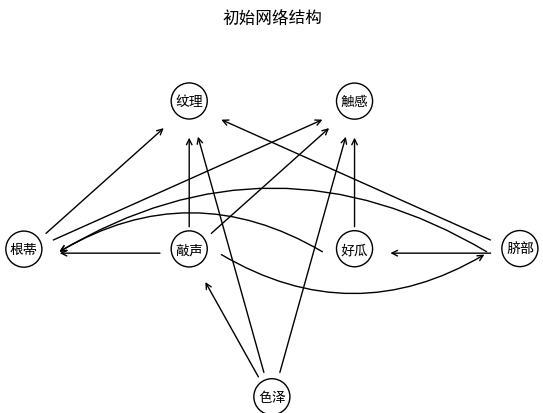

===========训练贝叶斯网============
初始BIC评分:94.457(结构38.107,经验56.350)
调整后BIC评分:90.221(结构39.807,经验50.414)
调整后BIC评分:89.358(结构39.807,经验49.551)
调整后BIC评分:89.344(结构40.657,经验48.688)
调整后BIC评分:89.868(结构40.657,经验49.211)
调整后BIC评分:75.432(结构25.357,经验50.074)
调整后BIC评分:71.195(结构20.257,经验50.937)
调整后BIC评分:66.095(结构15.158,经验50.937)
调整后BIC评分:65.455(结构12.608,经验52.847)
调整后BIC评分:70.215(结构17.708,经验52.507)
调整后BIC评分:69.469(结构20.257,经验49.211)
调整后BIC评分:71.378(结构20.257,经验51.121)
调整后BIC评分:67.142(结构15.158,经验51.984)
调整后BIC评分:66.618(结构15.158,经验51.461)
调整后BIC评分:65.455(结构12.608,经验52.847)
调整后BIC评分:64.347(结构10.908,经验53.439)
调整后BIC评分:67.489(结构10.483,经验57.006)
调整后BIC评分:66.965(结构10.483,经验56.482)
调整后BIC评分:64.347(结构10.908,经验53.439)
调整后BIC评分:64.347(结构10.908,经验53.439)
调整后BIC评分:64.347(结构10.908,经验53.439)
调整后BIC评分:64.347(结构10.908,经验53.439)


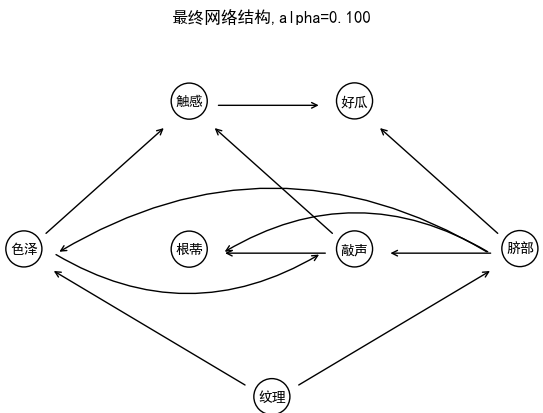

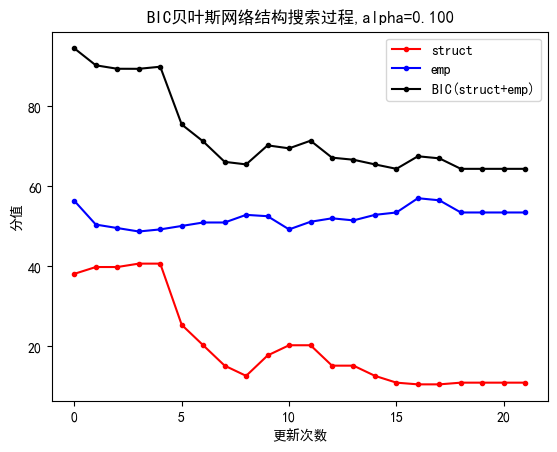

In [1]:
# -*- coding: utf-8 -*-
"""
Created on Wed Jan 15 17:02:12 2020
@author: lsly
"""
import numpy as np
import matplotlib.pyplot as plt

#==============首先编写几个函数，主程序见后==============
def relationship(net):
    # 计算网络中的每个结点的父母结点以及父母以上的祖辈结点
    # 输入：
    # net:array类型，网络结构，右上角元素ij表示各个连接边
    #     取值0表示无边，取值1表示Xi->Xj,取值-1表示Xi<-Xj
    # 输出：
    # parents：list类型，存储各个结点的父节点编号，用取值1~N代表各个节点
    # grands:list类型，存储各个结点更深的依赖节点，可以看成是“祖结点”
    # circle:list类型，存储环节点编号，若图中存在环，那么这个结点将是它本身的“祖结点”
    
    N=len(net)     #节点数
    #-----确定父结点-----
    parents=[list(np.where(net[i,:]==-1)[0]+1)+
             list(np.where(net[:,i]==1)[0]+1) 
             for i in range(N)]
    grands=[]
    #-----确定“祖结点”-----
    for i in range(N):
        grand=[]
        #---爷爷辈---
        for j in parents[i]:
            for k in parents[j-1]:
                if k not in grand:
                    grand.append(k)
        #---曾祖及以上辈---
        loop=True
        while loop:
            loop=False
            for j in grand:
                for k in parents[j-1]:
                    if k not in grand:
                        grand.append(k)
                        loop=True
        grands.append(grand)
    #-----判断环结点-----
    circle=[i+1 for i in range(N) if i+1 in grands[i]]
    return parents,grands,circle

def draw(net,name=None,title=''):
    # 绘制贝叶斯网络的变量关系图
    # net:array类型，网络结构，右上角元素ij表示各个连接边
    #     取值0表示无边，取值1表示Xi->Xj,取值-1表示Xi<-Xj
    # name:指定各个节点的名称，默认为None，用x1,x2...xN作为名称
    N=net.shape[0]
    Level=np.ones(N,dtype=int)
    #-----确定层级-----
    for i in range(N):
        for j in range(i+1,N):
            if net[i][j]==1 and Level[j]<=Level[i]:
                Level[j]+=1
            if net[i][j]==-1 and Level[i]<=Level[j]:
                Level[i]+=1
    #-----确定横向坐标-----
    position=np.zeros(N)
    for i in set(Level):
        num=sum(Level==i)
        position[Level==i]=np.linspace(-(num-1)/2,(num-1)/2,num)
    #-----画图-----
    plt.figure()
    plt.title(title)
    #设置出图显示中文
    plt.rcParams['font.sans-serif']=['SimHei']
    plt.rcParams['axes.unicode_minus'] = False
    #--先画出各个结点---
    for i in range(N):
        if name==None:
            text='x%d'%(i+1)
        else:
            text=name[i]
        plt.annotate(text,xy=[position[i],Level[i]],bbox={'boxstyle':'circle','fc':'1'},ha='center')
    #--再画连接线---
    for i in range(N):
        for j in range(i+1,N):
            if net[i][j]==1:
                xy=np.array([position[j],Level[j]])
                xytext=np.array([position[i],Level[i]])
            if net[i][j]==-1:
                xy=np.array([position[i],Level[i]])
                xytext=np.array([position[j],Level[j]])
            if net[i][j]!=0:
                L=np.sqrt(sum((xy-xytext)**2))
                xy=xy-(xy-xytext)*0.2/L
                xytext=xytext+(xy-xytext)*0.2/L
                if (xy[0]==xytext[0] and abs(xy[1]-xytext[1])>1)or\
                   (xy[1]==xytext[1] and abs(xy[0]-xytext[0])>1):
                    arrowprops=dict(arrowstyle='->',connectionstyle='arc3,rad=0.3')
                    #画弧线，避免遮挡(只考虑了横向和竖向边，暂未考虑斜向边遮挡的情况)
                else:
                    arrowprops=dict(arrowstyle='->')
                plt.annotate('',xy=xy,xytext=xytext,arrowprops=arrowprops,ha='center')  
    plt.axis([position.min(),position.max(),Level.min(),Level.max()+0.5])
    plt.axis('off')
    plt.show()


def coder(StateNums):
    # 编码器,
    # 设有结点x1,x2,...xN,各个结点的状态数为s1,s2,...sN,
    # 那么结点取值的组合数目为s1*s2*...sN,
    # 这些组合状态可以编码表示为[0,0,...0]~[s1-1,s2-1,...sN-1]
    # 输出：
    #     StateNums：各个结点状态数,
    #                比如[2,3,2]意为x1,x2,x3分别有2,3,2种状态，
    #                组合起来便有12种状态。
    # 输出：
    #     codes:用于遍历所有状态的索引编号，
    #          比如，对于[2,3],总共6种组合状态，遍历这6种组合状态的编码为：
    #          [0,0],[0,1],[0,2],[1,0],[1,1],[1,2]
    
    Nodes=len(StateNums)       #结点数
    states=np.prod(StateNums)  #组合状态数
    codes=[]
    for s in range(states):
        s0=s
        code=[]
        for step in range(Nodes-1):
            wight=np.prod(StateNums[step+1:])
            code.append(s0//wight)
            s0=s0%wight
        code.append(s0)
        codes.append(code)
    return codes 

def EM(net,D,ZStateNum,Try=1):
    # EM算法计算隐变量概率分布Q(z),这里仅考虑单个隐变量的简单情况
    # 输入：
    #     net:贝叶斯网络结构，以矩阵右上角元素表示连接关系，
    #         约定将隐变量排在最后一个。
    #     D:可观测变量数据集
    #     ZStateNum:隐变量状态数(离散取值数目)结果
    #     Try:尝试次数，由于EM算法收敛到的结果受初始值影响较大，
    #         因此，尝试不同初始值，最终选择边际似然最大的。
    # 输出：
    #     Qz：隐变量概率分布
    
    #=====网络性质=====
    parents=[list(np.where(net[i,:]==-1)[0])+
             list(np.where(net[:,i]==1)[0]) 
             for i in range(len(net))]           #计算各个结点的父节点
    #=====可观测变量参数=====
    m,Nx=D.shape                                 #样本数和可观测变量数
    values=[np.unique(D[:,i])for i in range(Nx)] #可观测变量的离散取值
    #=====隐变量子节点=====
    Zsonindex=list(np.where((net[:Nx,Nx:]==-1).any(axis=1))[0])  #隐结点子节点索引号
    
    
    #=====运行多次EM，每次随机初始化Qz，最终选择边际似然最大的结果=====
    for t in range(Try):
        #=====隐变量分布初始化=====
        Qz=np.random.rand(m,ZStateNum)  #初始化隐变量概率分布
        Qz=Qz/Qz.sum(axis=1).reshape(-1,1)       #概率归一化
        #Qz=np.c_[np.ones([m,1]),np.zeros([m,2])]
        #=====迭代更新Qz=====
        dif=1  #两次Qz的差别
        while dif>1E-8:
            NewQz=np.ones(Qz.shape)
            #-----对于隐结点-----
            pa=parents[-1]            #隐结点的父结点
            if len(parents[-1])==0:   #如果隐结点没有父节点
                NewQz*=Qz.sum(axis=0)
            else:
                ValueNums=[len(values[p]) for p in pa] #各个父结点的状态数
                codes=coder(ValueNums)                 #用于遍历各种取值的编码
                for code in codes:
                    #父结点取值组合
                    CombValue=[values[pa[p]][code[p]] for p in range(len(pa))]
                    index=np.where((D[:,pa]==CombValue).all(axis=1))[0]
                    NewQz[index]*=Qz[index].sum(axis=0) if len(index)!=0 else 1
            #-----对于隐结点的子结点-----
            for son in Zsonindex:
                #分子部分
                pa=parents[son]  #父结点,
                Nodes=pa+[son]   #加上该结点本身,
                Nodes.remove(Nx) #然后，移去隐结点作为考察结点
                ValueNums=[len(values[N]) for N in Nodes] #各个结点的状态数
                codes=coder(ValueNums)                   #用于遍历各种取值的编码
                for code in codes:
                    CombValue=[values[Nodes[N]][code[N]] for N in range(len(Nodes))]
                    index=np.where((D[:,Nodes]==CombValue).all(axis=1))[0]
                    NewQz[index]*=Qz[index].sum(axis=0) if len(index)!=0 else 1
                #分母部分
                pa=parents[son]+[]  #仅考察父结点
                pa.remove(Nx)       #移去隐结点
                if len(pa)==0:      #如果父结点只有隐结点一个
                    NewQz/=Qz.sum(axis=0)
                else:
                    ValueNums=[len(values[p]) for p in pa] #各个父结点的状态数
                    codes=coder(ValueNums)                 #用于遍历各种取值的编码
                    for code in codes:
                        #父结点取值组合
                        CombValue=[values[pa[p]][code[p]] for p in range(len(pa))]
                        index=np.where((D[:,pa]==CombValue).all(axis=1))[0]
                        NewQz[index]/=Qz[index].sum(axis=0)+1E-100 if len(index)!=0 else 1
            NewQz=NewQz/NewQz.sum(axis=1).reshape(-1,1)  #归一化
            dif=np.sum((Qz-NewQz)**2,axis=1).mean()     #新旧Qz的差别
            Qz=NewQz                                    #更新Qz
        
        if t==0:
            BestQz=Qz
            maxLL=LL(net,D,Qz,consider=(Zsonindex+[Nx]))
        else:
            newLL=LL(net,D,Qz,consider=(Zsonindex+[Nx]))
            if newLL>maxLL:
                maxLL=newLL
                BestQz=Qz
    return BestQz
        

def LL(net,D,Qz,consider=None):
    # 含有单个隐变量的情况下，计算边际似然
    # 输入：
    #     net:贝叶斯网络结构，以矩阵右上角元素表示连接关系，
    #         约定将隐变量排在最后一个。
    #     D:可观测变量数据集
    #     Qz：隐变量概率分布
    #     consider:所考察的结点。根据分析，
    #              边际似然中部分项可以表示为各个结点求和的形式，
    #              因此可以指定求和所包含的结点
    # 输出：
    #     LL：边际似然
    
    #=====网络性质=====
    parents=[list(np.where(net[i,:]==-1)[0])+
             list(np.where(net[:,i]==1)[0]) 
             for i in range(len(net))]           #计算各个结点的父节点
    #=====可观测变量参数=====
    m,Nx=D.shape                                 #样本数和可观测变量数
    values=[np.unique(D[:,i])for i in range(Nx)] #可观测变量的离散取值
    #=====待考察结点=====
    if consider is None:
        consider=range(Nx+1)
    #=====计算边际似然的求和项=====
    LL=0
    #print(consider)
    for i in consider:
        #print(i)
        pa=parents[i]  #父结点
        sign=1
        for nodes in [pa+[i],pa]:  #nodes为当前所考察的结点
            if len(nodes)==0:  #考虑当前xi没有父结点的情况
                LL+=sign*m*np.log(m)
                continue
            zin=nodes.count(Nx)!=0  #是否含有隐结点
            if zin:
                nodes.remove(Nx)
            if len(nodes)==0:   #除了隐结点外没有其他结点
                mz=Qz.sum(axis=0)
                LL+=sign*sum(np.log(mz**mz))
            else:
                StateNums=[len(values[nd]) for nd in nodes]
                for code in coder(StateNums):
                    CombValue=[values[nodes[N]][code[N]] for N in range(len(nodes))]
                    index=np.where((D[:,nodes]==CombValue).all(axis=1))[0]
                    if zin:
                        mz=Qz[index].sum(axis=0)
                        LL+=sign*sum(np.log(mz**mz))
                    else:
                        mz=len(index)
                        LL+=sign*(np.log(mz**mz))
            sign*=-1
    #=====计算隐变量概率分布项=====
    LL-=np.sum(np.log(Qz**Qz))
    return LL
            
def BIC(net,D,Qz,alpha=1,consider=None):
    # 计算BIC评分
    # 输入：
    #     net:贝叶斯网络结构，以矩阵右上角元素表示连接关系，
    #         约定将隐变量排在最后一个。
    #     D:可观测变量数据集
    #     Qz：隐变量分布
    #     alpha:结构项的比重系数
    #     consider:所考察的结点。根据分析，
    #              BIC评分中前两项可以表示为各个结点求和的形式，
    #              因此可以指定求和所包含的结点
    # 输出：
    #     np.array([struct,emp])：BIC评分结构项和经验项两部分的分值
    
    #-----从数据集D中提取一些信息-----
    m,Nx=D.shape   #样本数和可观测变量数特征数
    values=[list(np.unique(D[:,i])) for i in range(len(D[0]))] #各个离散属性的可能取值
    values.append(range(ZStateNum))            #再加上隐变量的取值数
    #-----父节点-----
    parents=[list(np.where(net[i,:]==-1)[0])+
             list(np.where(net[:,i]==1)[0]) 
             for i in range(len(net))]
    #-----计算BIC评分-----
    emp=-LL(net,D,Qz,consider)  #经验项部分调用LL函数来计算
    struct=0                         #下面计算结构项
    if consider is None:
        consider=range(Nx+1)
    for i in consider:
        r=len(values[i])  #Xi结点的取值数
        pa=parents[i]     #Xi的父节点编号
        nums=[len(values[p]) for p in pa]   #父节点取值数
        q=np.prod(nums)                     #父节点取值组合数  
        struct+=q*(r-1)/2*np.log(m)         #对结构项的贡献
    return np.array([struct*alpha,emp])

def BIC_change(net0,D,Qz,change,alpha=1):
    # 计算贝叶斯网络结构发生变化后BIC评分的变化量
    # 输入：net0:变化前的网络结构
    #       D:数据集
    #       Qz:隐结点分布
    #      change:网络结构的变化，内容为[i,j,value],
    #             意为xi到xj之间的连接边变为value值
    #      alpha：计算BIC评分时，结构项的比重系数
    # 输出：dscore:BIC评分的改变,内容为[struct,emp],
    #             分别表示结构项和经验项的变化
    #       NewQz:新的隐结点分布
    
    #=====网络结构的改变
    i,j,value=change
    consider=[i,j]
    net1=net0.copy()
    net1[i,j]=value
    #=====隐变量子节点
    son0=list(np.where(net0[:-1,-1]==-1)[0])
    son1=list(np.where(net1[:-1,-1]==-1)[0])
    #=====判断是否需要重新运行EM
    if j==len(net0)-1 or (i in son0) or (j in son0):
        Qz1=EM(net1,D,Qz.shape[1],12)
        consider=consider+son0+son1+[len(net0)-1]
        consider=np.unique(consider)
    else:
        Qz1=Qz
    dscore=BIC(net1,D,Qz1,alpha,consider)-BIC(net0,D,Qz,alpha,consider)
    return dscore,Qz1

#================================================
#                  主程序
#================================================

#==============西瓜数据集2.0======================
# 将X和类标记Y放一起
D=[['青绿','蜷缩','浊响','清晰','凹陷','硬滑','是'],
   ['乌黑','蜷缩','沉闷','清晰','凹陷','硬滑','是'],
   ['乌黑','蜷缩','浊响','清晰','凹陷','硬滑','是'],
   ['青绿','蜷缩','沉闷','清晰','凹陷','硬滑','是'],
   ['浅白','蜷缩','浊响','清晰','凹陷','硬滑','是'],
   ['青绿','稍蜷','浊响','清晰','稍凹','软粘','是'],
   ['乌黑','稍蜷','浊响','稍糊','稍凹','软粘','是'],
   ['乌黑','稍蜷','浊响','清晰','稍凹','硬滑','是'],
   ['乌黑','稍蜷','沉闷','稍糊','稍凹','硬滑','否'],
   ['青绿','硬挺','清脆','清晰','平坦','软粘','否'],
   ['浅白','硬挺','清脆','模糊','平坦','硬滑','否'],
   ['浅白','蜷缩','浊响','模糊','平坦','软粘','否'],
   ['青绿','稍蜷','浊响','稍糊','凹陷','硬滑','否'],
   ['浅白','稍蜷','沉闷','稍糊','凹陷','硬滑','否'],
   ['乌黑','稍蜷','浊响','清晰','稍凹','软粘','否'],
   ['浅白','蜷缩','浊响','模糊','平坦','硬滑','否'],
   ['青绿','蜷缩','沉闷','稍糊','稍凹','硬滑','否']]
D=np.array(D)
FeatureName=['色泽','根蒂','敲声','纹理','脐部','触感','好瓜']

#======将“脐部”视为隐变量，对数据进行相应的修改=====
D=D[:,[0,1,2,3,5,6]]                              #可观测数据集
XName=['色泽','根蒂','敲声','纹理','触感','好瓜']  #x变量名称
ZName=['脐部']                                   #隐变量名称
ZStateNum=3                                     #隐变量的状态数(离散取值数目)
FeatureName=XName+ZName                        #包括可观测变量和隐变量的所有变量的名称

#=================初始化为朴素贝叶斯网=============

#构建贝叶斯网络，右上角元素ij表示各个连接边
#取值0表示无边，取值1表示Xi->Xj,取值-1表示Xi<-Xj
m=D.shape[0]             #样本数
N=len(XName)+1  #结点数

net=np.zeros((N,N))
choose=4    #选择初始化类型，可选1,2,3,4
            #分别代表全独立网络、朴素贝叶斯网络、全连接网络,随机网络
if choose==1:    #全独立网络:图中没有任何连接边
    pass
elif choose==2:  #朴素贝叶斯网络:所有其他特征的父节点都是类标记"好瓜"
    net[:-1,-1]=-1
elif choose==3:  #全连接网络：任意两个节点都有连接边
    again=True   #若存在环，则重新生成
    while again:
        for i in range(N-1):
            net[i,i+1:]=np.random.randint(0,2,N-i-1)*2-1
        again=len(relationship(net)[2])!=0
elif choose==4:  #随机网络：任意两个节点之间的连接边可有可无
    again=True   #若存在环，则重新生成
    while again:
        for i in range(N-1):
            net[i,i+1:]=np.random.randint(-1,2,N-i-1)
        again=len(relationship(net)[2])!=0

draw(net,FeatureName,'初始网络结构')


#==============下山法搜寻BIC下降的贝叶斯网==========
alpha=0.1  #BIC评分的结构项系数
Qz=EM(net,D,ZStateNum,12)
score0=BIC(net,D,Qz,alpha)
score=[score0]
print('===========训练贝叶斯网============')
print('初始BIC评分:%.3f(结构%.3f,经验%.3f)'%(sum(score0),score0[0],score0[1]))
eta,tao=0.1,50          #允许eta的概率调整到BIC评分增大的网络
                        #阈值随迭代次数指数下降
for loop in range(500):
    # 随机指定需要调整的连接边的两个节点：Xi和Xj
    i,j=np.random.randint(0,N,2)
    while i==j:
        i,j=np.random.randint(0,N,2)
    i,j=(i,j)  if  i<j  else  (j,i)
    # 确定需要调整的结果
    value0=net[i,j]                 #可能为0,1,-1
    change=np.random.randint(2)*2-1 #结果+1或-1
    value1=(value0+1+change)%3 -1   #调整后的取值
    net1=net.copy()
    net1[i,j]=value1
    if value1!=0 and len(relationship(net1)[2])!=0:
        #如果value1取值非零，说明为转向或者增边
        #若引入环，则放弃该调整
        continue
    chage,NewQz=BIC_change(net,D,Qz,[i,j,value1],alpha)
    if sum(chage)<0 or np.random.rand()<eta*np.exp(-loop/tao):
        score0=score0+chage
        score.append(score0)
        net=net1
        Qz=NewQz
        print('调整后BIC评分:%.3f(结构%.3f,经验%.3f)'
              %(sum(score0),score0[0],score0[1]))
    else:
        continue

draw(net,FeatureName,'最终网络结构,alpha=%.3f'%(alpha))
Qz=EM(net,D,ZStateNum)

score=np.array(score)
x=np.arange(len(score))
plt.title('BIC贝叶斯网络结构搜索过程,alpha=%.3f'%(alpha))
plt.xlabel('更新次数')
plt.ylabel('分值')
plt.plot(x,score[:,0],'.r-')
plt.plot(x,score[:,1],'.b-')
plt.plot(x,score.sum(axis=1),'.k-')
plt.legend(['struct','emp','BIC(struct+emp)'])
plt.show()


以下是20241104被erp的年青们的passion影响，纵然已知没有太多意义（在不投入大量数据收集成本情况之下），还是浅浅的玩了一下

只是标准化

In [29]:
import pandas as pd  
from sklearn.preprocessing import StandardScaler  
  
# 读取没有列名的Excel文件  
data = pd.read_excel(r"C:\Users\admin\Desktop\标准化专用.xls", header=None)  
  
# 初始化StandardScaler  
scaler = StandardScaler()  
  
# 由于数据没有列名，我们直接对DataFrame的值进行拟合和转换  
# 注意：这里我们假设所有列都需要标准化，且不存在完全相同的列（即没有冗余特征）  
# 如果存在冗余特征，StandardScaler仍然可以处理，但标准化后的这些列将完全相同  
scaled_data = scaler.fit_transform(data)  
  
# 将标准化后的数据转换回DataFrame（仍然没有列名）  
scaled_df = pd.DataFrame(scaled_data)  
  
# 如果需要，可以将标准化后的数据保存到一个新的Excel文件中  
scaled_df.to_excel(r'C:\Users\admin\Desktop\标准化结果.xls', index=False, header=False)  
  
# 在这里，我们可以选择打印标准化后的数据来检查（由于没有列名，输出可能不太直观）  
print(scaled_df)

          0         1         2         3
0  1.108032  0.640912  1.166212  1.851021
1 -0.503651  0.255120 -0.539155 -0.419261
2 -0.235037 -1.535814  1.935340  0.248134
3 -1.040878  1.216772 -0.370487  0.827113
4 -1.309492  0.797039 -1.173867  0.285211
5  1.913873  0.191765  0.165100 -0.387887
6  0.033577  0.162349 -0.166528 -0.687359
7  0.033577 -1.728144 -1.016616 -1.716972


d:\anaconda\envs\TF\lib\site-packages\ipykernel_launcher.py:19: FutureWarning: As the xlwt package is no longer maintained, the xlwt engine will be removed in a future version of pandas. This is the only engine in pandas that supports writing in the xls format. Install openpyxl and write to an xlsx file instead. You can set the option io.excel.xls.writer to 'xlwt' to silence this warning. While this option is deprecated and will also raise a warning, it can be globally set and the warning suppressed.


In [33]:
import pandas as pd  
from sklearn.model_selection import train_test_split  
from sklearn.linear_model import LinearRegression  
from sklearn.metrics import mean_squared_error, r2_score  
  
# 假设您的数据已经存储在一个名为data的Pandas DataFrame中  
# 如果数据是从Excel文件中读取的，您可以使用pd.read_excel('filename.xlsx', header=None)来读取，并手动添加列名  
# 例如：data.columns = ['价格', '品牌知名度', '产品质量', '上季度市占率', '本季节市占率', '结果']  
data=pd.read_excel(r"C:\Users\admin\Desktop\处理.xls")
# 由于您的数据中上季度市占率全部为0，我们可以考虑将其从特征中移除（或者保留并观察其系数）  
# 在这里我们保留所有特征进行演示  


X = data[['价格￥', '品牌知名度', '产品质量', '上季度市占率']]
y = data['本季节市占率']
  
# 将数据划分为训练集和测试集（这里简单划分为80%训练集和20%测试集）  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  
  
# 创建线性回归模型  
model = LinearRegression()  
  
# 拟合模型  
model.fit(X_train, y_train)  
  
# 使用测试集进行预测  
y_pred = model.predict(X_test)  
  
# 评估模型性能  
mse = mean_squared_error(y_test, y_pred)  
r2 = r2_score(y_test, y_pred)  

print(f"Mean Squared Error: {mse}")  
print(f"R^2 Score: {r2}")  
  
# 打印模型系数  
print(f"Coefficients: {model.coef_}")  
print(f"Intercept: {model.intercept_}")
print(y_pred)
print(y_test)

Mean Squared Error: 0.0002749561280946385
R^2 Score: -0.024345703724673262
Coefficients: [-0.00615383  0.00774304  0.01089547  0.01391329]
Intercept: 0.11823519521043352
[0.13022926 0.09975803 0.12400849 0.14439894 0.12965481 0.09734061
 0.11660742 0.11646696 0.11160235 0.13121018 0.12898507 0.10434445
 0.11118317 0.11100355]
46    0.1398
16    0.0990
4     0.1090
9     0.1229
28    0.1383
41    0.0959
58    0.1009
5     0.1126
61    0.1462
12    0.1182
25    0.0951
65    0.1019
47    0.1257
0     0.1113
Name: 本季节市占率, dtype: float64


In [ ]:
# https://zhuanlan.zhihu.com/p/29649128 调参可以学习
import pandas as pd  
from sklearn.model_selection import train_test_split  
from xgboost import XGBRegressor  
from sklearn.metrics import mean_squared_error, r2_score  
  
# 读取数据  
data = pd.read_excel(r"C:\Users\admin\Desktop\处理.xls")  
  
# 选择特征和目标变量  
X = data[['价格￥', '品牌知名度', '产品质量', '上季度市占率']]  
y = data['本季节市占率']  
  
# 划分训练集和测试集  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  
  
# 创建XGBoost回归模型  
model = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)  
  
# 拟合模型  
model.fit(X_train, y_train)  
  
# 预测  
y_pred = model.predict(X_test)  
  
# 评估模型  
mse = mean_squared_error(y_test, y_pred)  
r2 = r2_score(y_test, y_pred)  
  
print(f"XGBoost - Mean Squared Error: {mse}")  
print(f"XGBoost - R^2 Score: {r2}")
print(y_pred)
print(y_test)

XGBoost - Mean Squared Error: 0.00015927069081205416
XGBoost - R^2 Score: 0.40663898276006527
[0.12604865 0.10068566 0.10955602 0.12070108 0.1217849  0.09702737
 0.1198393  0.1185135  0.12313049 0.10917269 0.11956577 0.10028803
 0.11357005 0.11303657]
46    0.1398
16    0.0990
4     0.1090
9     0.1229
28    0.1383
41    0.0959
58    0.1009
5     0.1126
61    0.1462
12    0.1182
25    0.0951
65    0.1019
47    0.1257
0     0.1113
Name: 本季节市占率, dtype: float64


In [38]:
import pandas as pd  
from sklearn.model_selection import train_test_split  
from sklearn.svm import SVR  
from sklearn.preprocessing import StandardScaler  
from sklearn.pipeline import make_pipeline  
from sklearn.metrics import mean_squared_error, r2_score  
  
# 读取数据  
data = pd.read_excel(r"C:\Users\admin\Desktop\处理.xls")  
  
# 选择特征和目标变量  
X = data[['价格￥', '品牌知名度', '产品质量', '上季度市占率']]  
y = data['本季节市占率']  
  
# 划分训练集和测试集  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  
  
# 创建SVR模型，使用RBF核，并标准化特征  
model = make_pipeline(StandardScaler(), SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1))  
  
# 拟合模型  
model.fit(X_train, y_train)  
  
# 预测  
y_pred = model.predict(X_test)  
  
# 评估模型  
mse = mean_squared_error(y_test, y_pred)  
r2 = r2_score(y_test, y_pred)  
  
print(f"SVR - Mean Squared Error: {mse}")  
print(f"SVR - R^2 Score: {r2}")
print(y_pred)
print(y_test)

SVR - Mean Squared Error: 0.00038429107142857143
SVR - R^2 Score: -0.431671702411075
[0.12625 0.12625 0.12625 0.12625 0.12625 0.12625 0.12625 0.12625 0.12625
 0.12625 0.12625 0.12625 0.12625 0.12625]
46    0.1398
16    0.0990
4     0.1090
9     0.1229
28    0.1383
41    0.0959
58    0.1009
5     0.1126
61    0.1462
12    0.1182
25    0.0951
65    0.1019
47    0.1257
0     0.1113
Name: 本季节市占率, dtype: float64


In [42]:
import pandas as pd  
from sklearn.model_selection import train_test_split  
from sklearn.preprocessing import StandardScaler  
from sklearn.neural_network import MLPRegressor  
from sklearn.metrics import mean_squared_error, r2_score  
  
# 读取数据  
data = pd.read_excel(r"C:\Users\admin\Desktop\处理.xls")  
  
# 选择特征和目标变量  
X = data[['价格￥', '品牌知名度', '产品质量', '上季度市占率']]  
y = data['本季节市占率']  
  
# 划分训练集和测试集  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  
  
# 标准化特征  
scaler = StandardScaler()  
X_train_scaled = scaler.fit_transform(X_train)  
X_test_scaled = scaler.transform(X_test)  
  
# 创建MLP回归模型  
model = MLPRegressor(hidden_layer_sizes=(100,), max_iter=500, alpha=1e-4, solver='adam', random_state=42)  
  
# 拟合模型  
model.fit(X_train_scaled, y_train)  
  
# 预测  
y_pred = model.predict(X_test_scaled)  
  
# 评估模型  
mse = mean_squared_error(y_test, y_pred)  
r2 = r2_score(y_test, y_pred)  
  
print(f"MLPRegressor - Mean Squared Error: {mse}")  
print(f"MLPRegressor - R^2 Score: {r2}")
print(y_pred)
print(y_test)

MLPRegressor - Mean Squared Error: 0.0028299779832361366
MLPRegressor - R^2 Score: -9.543048481412912
[0.04879999 0.08957433 0.09909329 0.06365985 0.0948136  0.08899537
 0.10404221 0.16534363 0.0563539  0.12533566 0.15271052 0.11092382
 0.1916643  0.02741393]
46    0.1398
16    0.0990
4     0.1090
9     0.1229
28    0.1383
41    0.0959
58    0.1009
5     0.1126
61    0.1462
12    0.1182
25    0.0951
65    0.1019
47    0.1257
0     0.1113
Name: 本季节市占率, dtype: float64


In [ ]:
import pandas as pd  
import numpy as np  
  
# 读取没有列名的Excel文件  
data = pd.read_excel(r"C:\Users\admin\Desktop\标准化专用.xls", header=None)  
  
# 创建一个新的DataFrame来存储标准化后的数据（或者你可以直接修改原数据）  
# 但为了保持原数据的完整性，这里我们选择创建一个新的DataFrame  
standardized_data = pd.DataFrame()  
  
# 对每一列进行标准化处理（除了可能不需要标准化的最后一列，这里我们假设是品牌知名度）  
for i in range(data.shape[1]):  # 最后一列我们假设不需要标准化  
    mean = data.iloc[:, i].mean()  
    std = data.iloc[:, i].std()  
    standardized_data.iloc[:, i] = (data.iloc[:, i] - mean) / std  
  
# 如果最后一列确实是品牌知名度且不需要标准化，我们直接将其添加到新的DataFrame中  
# 但由于所有值可能相同，标准化后会变为0，这里我们直接复制原数据  
standardized_data.iloc[:, data.shape[1] - 1] = data.iloc[:, data.shape[1] - 1]  
  
# 如果你不想保留品牌知名度列的原始值（即标准化后的值应该是0），你可以这样设置：  
# standardized_data.iloc[:, data.shape[1] - 1] = 0  
  
# 注意：由于我们没有列名，所以这里的DataFrame没有列名。如果你需要，可以在保存之前添加列名。  
# 但由于你的要求是不赋予列名，所以这里我们跳过这一步。  
  
# 将标准化后的数据保存到一个新的Excel文件中  
standardized_data.to_excel(r'C:\Users\admin\Desktop\标准化结果.xls', index=False, header=False)  
  
# 如果你不想保存到文件，而是想在代码中进一步使用标准化后的数据，你可以直接使用standardized_data变量。

IndexError: iloc cannot enlarge its target object